In [1]:
import sys
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from sklearn.metrics.cluster import (v_measure_score, adjusted_rand_score, 
                                     contingency_matrix)
from dtaidistance import dtw
from scanfc import FoldChanges, Clustering
from simulation_functions import simulate_cluster_means_1, simulate_cluster_means_2
sys.path.insert(0, '..')
from clustering_suppl_functions import reorder_clusters
mpl.rcParams['font.family'] = 'serif'
for style in plt.style.available:
    if 'seaborn' in style:
        mpl.style.use(style)
        break

In [2]:
random_gen = np.random.RandomState(0)
nb_var = 300
time_points_1 = np.array([0.5,  1.,  2.,  3.,  4.,  7., 14., 21.])
nb_time_p = len(time_points_1)
sim_means_1 = np.zeros((nb_time_p, nb_var))

# Study 1: Distances & Algorithms 

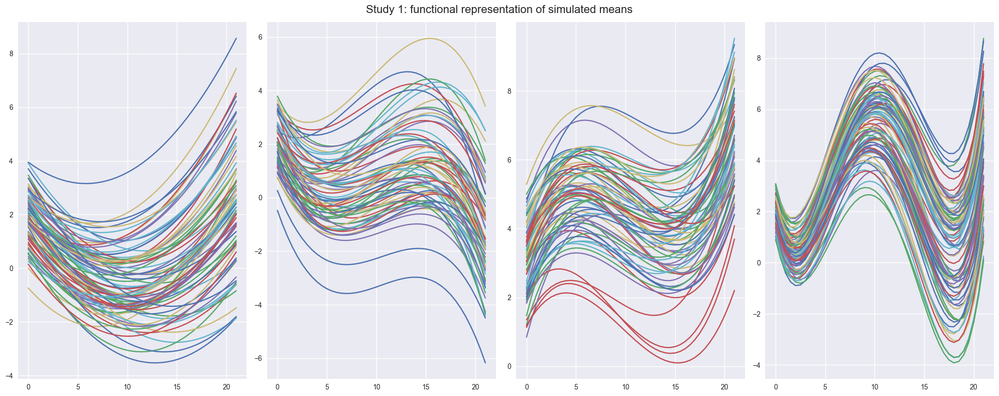

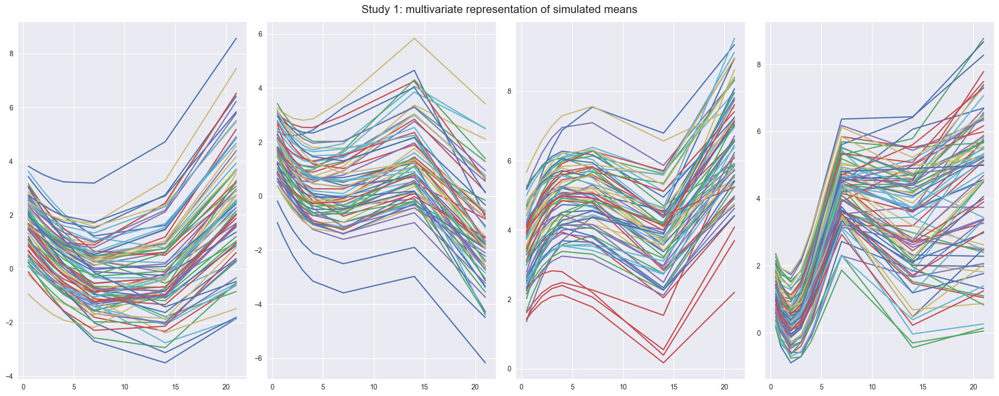

In [3]:
k = 4
sim_clusters = random_gen.choice(range(k), nb_var)
random_gen.shuffle(sim_clusters)

# Simulating means of k clusters:
plot_time_points = np.linspace(0, 21, 43)
time_p_ind_1 = np.array((1, 2, 4, 6, 8, 14, 28, 42))
fig_1, axs_1 = plt.subplots(1, k, figsize=(20, 8), sharey=False)
fig_2, axs_2 = plt.subplots(1, k, figsize=(20, 8), sharey=False)
for i, cl in enumerate(range(k)):
    cluster_i = np.argwhere(sim_clusters == cl)
    sim_means_plot_1 = simulate_cluster_means_1(cluster_i.size, plot_time_points,
                                                cl+1, random_gen=random_gen)
    axs_1[i].plot(plot_time_points, sim_means_plot_1)
    sim_means_1[:, np.squeeze(cluster_i)] = sim_means_plot_1[time_p_ind_1, :]
    axs_2[i].plot(time_points_1, sim_means_plot_1[time_p_ind_1, :])
fig_1.suptitle('Study 1: functional representation of simulated means',
               fontsize=16)
fig_1.tight_layout()
fig_2.suptitle('Study 1: multivariate representation of simulated means',
               fontsize=16)
fig_2.tight_layout()
plt.show()

In [4]:
# Simulating variances of k clusters (independent scenario):
sim_cov_1 = np.zeros((nb_time_p, nb_var, nb_var))
sim_var_1 = np.repeat(np.abs(random_gen.randn(nb_var)*2),
                      nb_time_p).reshape((nb_var, nb_time_p)).T
sim_cov_1[:, np.arange(nb_var), np.arange(nb_var)] = sim_var_1

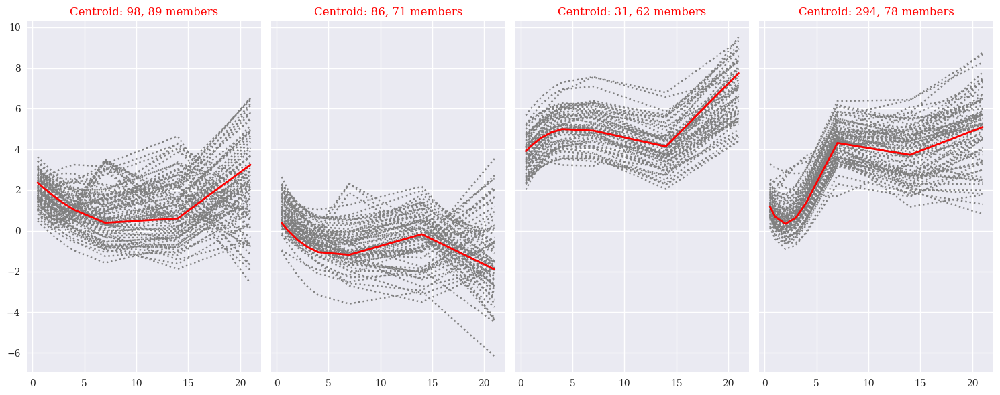

Contingency table (%), d2hat k-medoids:
[[17  8  0  0]
 [ 8 14  0  0]
 [ 2  0 20  1]
 [ 3  1  0 24]]
ARI:  0.5302461939974592
V-measure:  0.5672661530018915


In [5]:
# K-medoid clustering of simulated data, case of independent FCs:
K = 4
sim_fc_1 = FoldChanges(means=sim_means_1, cov=sim_cov_1, time_points=time_points_1)
cl_kmed_sim_1 = Clustering(fold_changes=sim_fc_1, dist='d2hat',
                           random_gen=random_gen)
(k_clusters_1,
 k_centroids_1,
 k_cost_1) = cl_kmed_sim_1.fc_clustering(K, nb_rep=50, disp_plot=False,
                                         algorithm='k-means-like')
(k_clusters_1,
 k_centroids_1) = reorder_clusters((1, 0, 3, 2), k_clusters_1, k_centroids_1)
cl_kmed_sim_1.plot_clusters(k, k_clusters_1, k_centroids_1)
comp_mat_1 = contingency_matrix(sim_clusters, k_clusters_1)
badly_classified = nb_var-np.diag(comp_mat_1).sum()
print('Contingency table (%), d2hat k-medoids:')
print(np.round(comp_mat_1/nb_var*100).astype(int))

print('ARI: ', adjusted_rand_score(sim_clusters, k_clusters_1))
print('V-measure: ', v_measure_score(sim_clusters, k_clusters_1))

# Study 2: Time Warping & DTW
### The effect of alignment

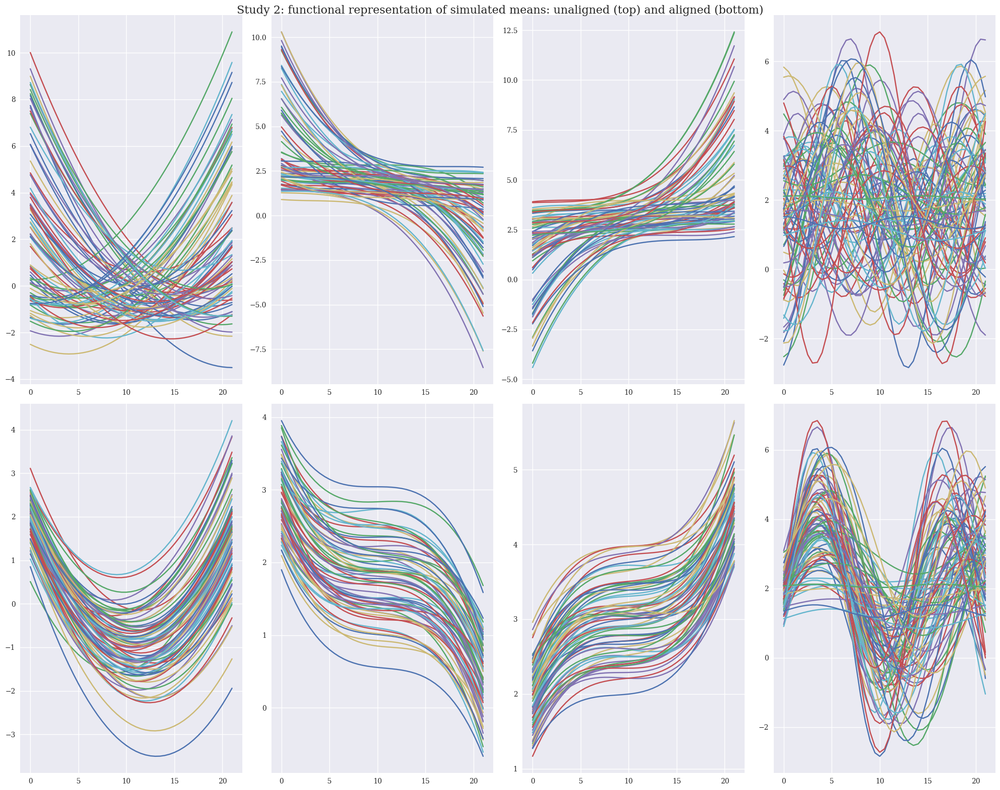

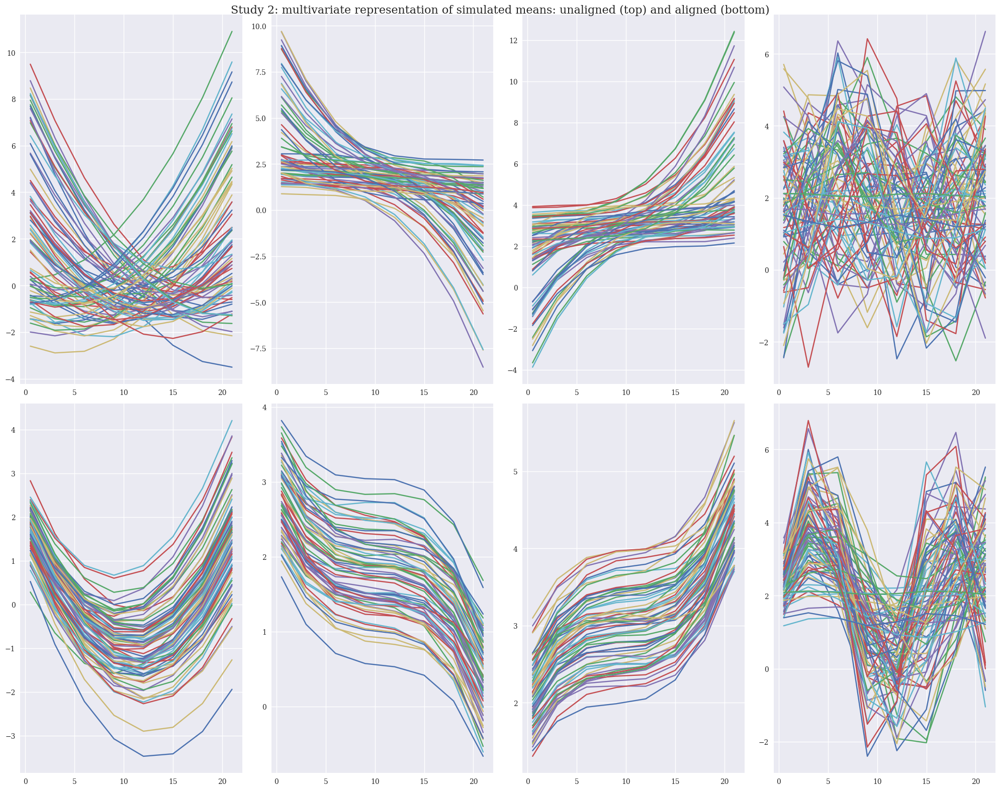

In [6]:
random_gen = np.random.RandomState(10)
# Simulating means of k clusters:
sim_means_2 = np.zeros((nb_time_p, nb_var))
time_p_ind_2 = np.array((1, 6, 12, 18, 24, 30, 36, 42))
time_points_2 = plot_time_points[time_p_ind_2]
fig_1, axs_1 = plt.subplots(2, k, figsize=(20, 16), sharey=False)
fig_2, axs_2 = plt.subplots(2, k, figsize=(20, 16), sharey=False)
for i, cl in enumerate(range(k)):
    cluster_i = np.argwhere(sim_clusters == cl)
    (sim_means_plot_2_ua,
     sim_means_plot_2_a) = simulate_cluster_means_2(cluster_i.size,
                                                    plot_time_points, cl+1,
                                                    random_gen=random_gen)
    axs_1[0][i].plot(plot_time_points, sim_means_plot_2_ua)
    sim_means_2[:, np.squeeze(
        cluster_i)] = sim_means_plot_2_ua[time_p_ind_2, :]
    axs_1[1][i].plot(plot_time_points, sim_means_plot_2_a)
    axs_2[0][i].plot(time_points_2, sim_means_plot_2_ua[time_p_ind_2, :])
    axs_2[1][i].plot(time_points_2, sim_means_plot_2_a[time_p_ind_2, :])

fig_1.suptitle('Study 2: functional representation of simulated means: unaligned (top) and aligned (bottom)',
               fontsize=16)
fig_1.tight_layout()
fig_2.suptitle('Study 2: multivariate representation of simulated means: unaligned (top) and aligned (bottom)',
               fontsize=16)
fig_2.tight_layout()
plt.show()

In [7]:
# Simulating variances of k clusters:
sim_cov_2 = np.zeros((nb_time_p, nb_var, nb_var))
sim_var_2 = np.repeat(np.abs(random_gen.randn(nb_var)),
                      nb_time_p).reshape((nb_var, nb_time_p)).T
sim_cov_2[:, np.arange(nb_var), np.arange(nb_var)] = sim_var_2

### k-medoids:

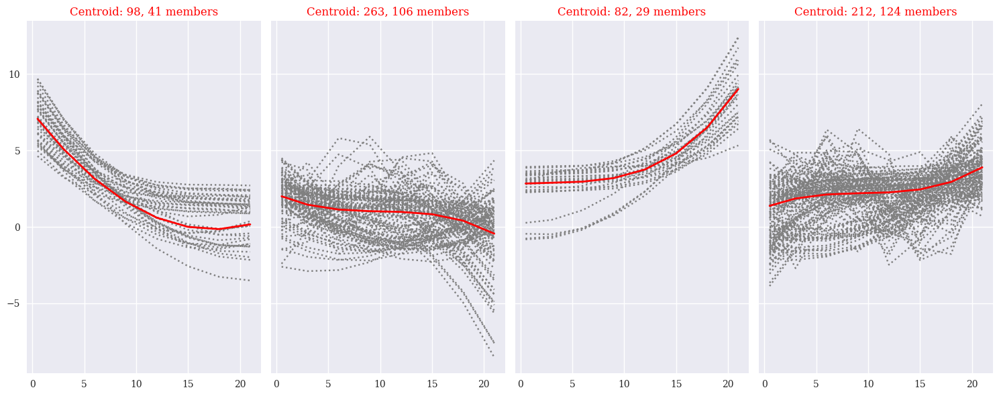

Contingency table (%), d2hat k-medoids (without time warping):
[[ 6 12  1  7]
 [ 7 14  0  1]
 [ 0  0  8 15]
 [ 0  9  0 19]]
ARI:  0.1855866279311852
V-measure:  0.31119135824253


In [8]:
# K-medoid clustering of simulated data WITHOUT time warping, case of independent FCs:
sim_fc_2 = FoldChanges(means=sim_means_2, cov=sim_cov_2, time_points=time_points_2)
cl_kmed_sim_2 = Clustering(fold_changes=sim_fc_2, dist='d2hat',
                           random_gen=random_gen)
(k_clusters_2,
 k_centroids_2,
 k_cost_2) = cl_kmed_sim_2.fc_clustering(K, nb_rep=50, disp_plot=False)
(k_clusters_2,
 k_centroids_2) = reorder_clusters((2, 1, 3, 0), k_clusters_2, k_centroids_2)
cl_kmed_sim_2.plot_clusters(k, k_clusters_2, k_centroids_2)
comp_mat_2 = contingency_matrix(sim_clusters, k_clusters_2)
badly_classified = nb_var-np.diag(comp_mat_2).sum()
print('Contingency table (%), d2hat k-medoids (without time warping):')
print(np.round(comp_mat_2/nb_var*100).astype(int))

print('ARI: ', adjusted_rand_score(sim_clusters, k_clusters_2))
print('V-measure: ', v_measure_score(sim_clusters, k_clusters_2))

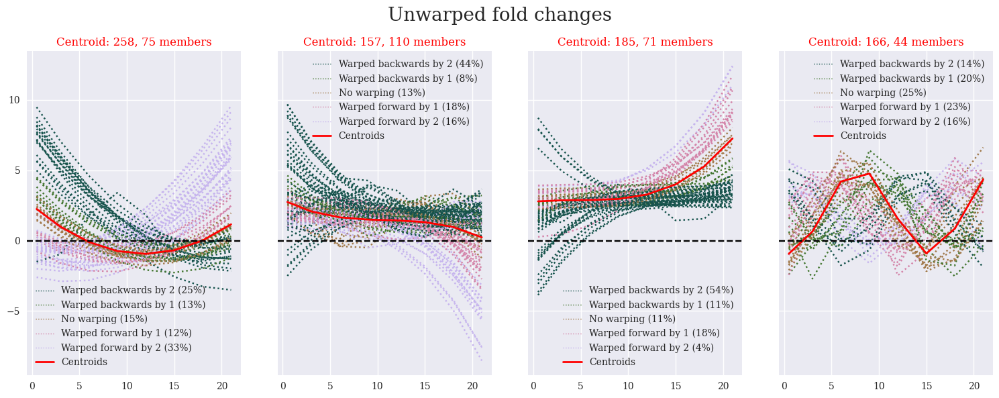

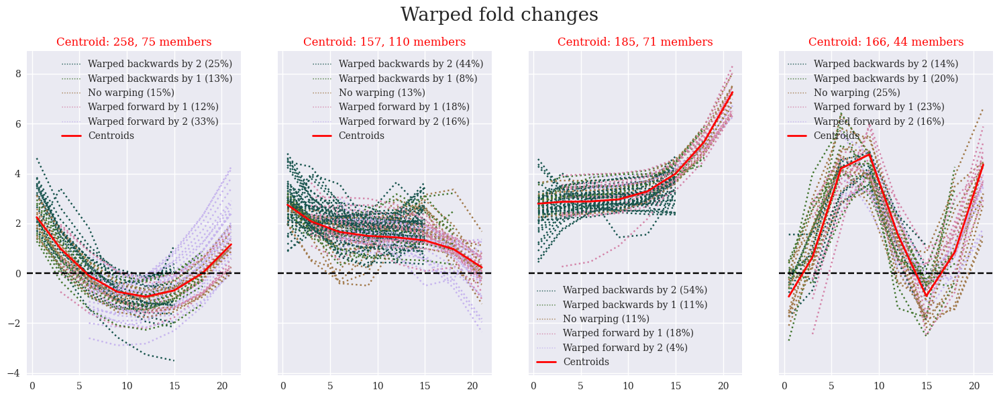

Contingency table (%), d2hat k-medoids (with time warping):
[[25  1  0  0]
 [ 0 21  1  0]
 [ 0  2 21  0]
 [ 0 13  1 15]]
ARI:  0.6115175286946404
V-measure:  0.6753047610105228


In [9]:
# K-medoid clustering of simulated data WITH time warping, case of independent FCs:
max_warp_step = 2
cl_kmed_sim_2_tw = Clustering(fold_changes=sim_fc_2, dist='d2hat',
                              time_warp=True, max_warp_step=max_warp_step,
                              random_gen=random_gen)
(k_clusters_2_tw,
 k_centroids_2_tw,
 k_warps_2,
 k_cost_2_tw) = cl_kmed_sim_2_tw.fc_clustering(K, nb_rep=50, disp_plot=False)
(k_clusters_2_tw,
 k_centroids_2_tw) = reorder_clusters((2, 0, 1, 3), k_clusters_2_tw,
                                      k_centroids_2_tw)
cl_kmed_sim_2_tw.plot_clusters(k, k_clusters_2_tw, k_centroids_2_tw,
                               warps=k_warps_2)
comp_mat_2_tw = contingency_matrix(sim_clusters, k_clusters_2_tw)
badly_classified = nb_var-np.diag(comp_mat_2_tw).sum()
print('Contingency table (%), d2hat k-medoids (with time warping):')
print(np.round(comp_mat_2_tw/nb_var*100).astype(int))

print('ARI: ', adjusted_rand_score(sim_clusters, k_clusters_2_tw))
print('V-measure: ', v_measure_score(sim_clusters, k_clusters_2_tw))

### DTW:

In [10]:
random_gen = np.random.RandomState(10)
sim_means_DTW = np.expand_dims(sim_means_2.T, -1)
ds = dtw.distance_matrix(sim_means_DTW.squeeze(), window=3)
cl_DTW = Clustering(dist_mat=ds, dist='d2hat', random_gen=random_gen)

(clusters_DTW, centroids_DTW, cost_DTW) = cl_DTW.fc_clustering(K, nb_rep=50)

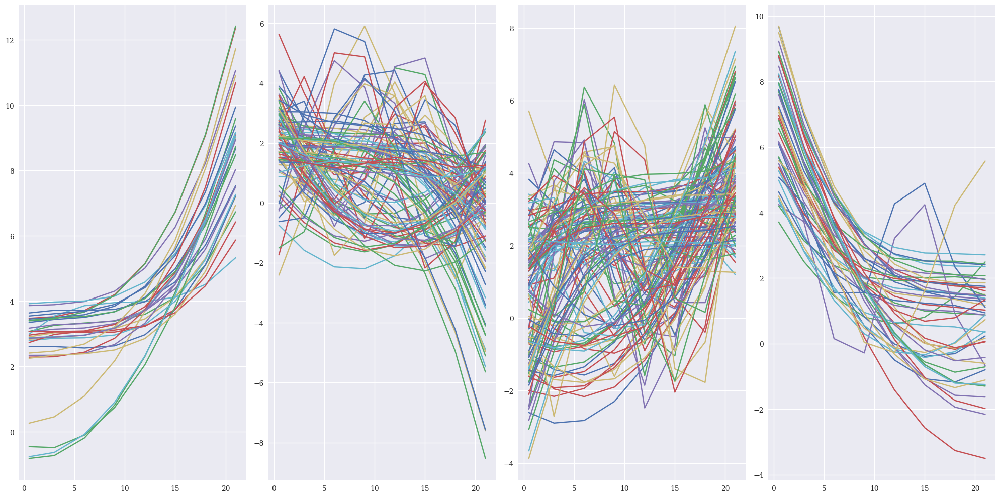

Contingency table (%), dynamic time warping with k-medoids:
[[ 1 10  8  7]
 [ 0 14  0  8]
 [ 9  0 14  0]
 [ 0  9 18  1]]
ARI:  0.1784490327143383
V-measure:  0.30114262646704426


In [11]:
(clusters_DTW, centroids_DTW) = reorder_clusters((3, 1, 0, 2), clusters_DTW, centroids_DTW)

fig, axs = plt.subplots(1, k, figsize=(20, 10), sharey=False)
for i, cl in enumerate(range(K)):
    cluster_i = np.argwhere(clusters_DTW==cl)
    axs[i].plot(time_points_2, sim_means_2[:, cluster_i.squeeze()])
plt.tight_layout()
plt.show()

comp_mat_DTW = contingency_matrix(sim_clusters, clusters_DTW)
badly_classified = nb_var-np.diag(comp_mat_DTW).sum()
print('Contingency table (%), dynamic time warping with k-medoids:')
print(np.round(comp_mat_DTW/nb_var*100).astype(int))

print('ARI: ', adjusted_rand_score(sim_clusters, clusters_DTW))
print('V-measure: ', v_measure_score(sim_clusters, clusters_DTW))